In [1]:
import pandas as pd 
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
os.getcwd()


'C:\\Users\\Christopher\\Desktop\\Hari_prasad\\bank_customer_churn\\notebooks'

In [3]:
df=pd.read_csv('c:/Users/Christopher/Desktop/Hari_prasad/bank_customer_churn/data/raw/train.csv')

In [4]:
df.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,0,15674932,Okwudilichukwu,668,France,Male,33.0,3,0.00,2,1.0,0.0,181449.97,0
1,1,15749177,Okwudiliolisa,627,France,Male,33.0,1,0.00,2,1.0,1.0,49503.50,0
2,2,15694510,Hsueh,678,France,Male,40.0,10,0.00,2,1.0,0.0,184866.69,0
3,3,15741417,Kao,581,France,Male,34.0,2,148882.54,1,1.0,1.0,84560.88,0
4,4,15766172,Chiemenam,716,Spain,Male,33.0,5,0.00,2,1.0,1.0,15068.83,0


In [5]:
df.shape

(165034, 14)

In [6]:
df.isnull().sum()

id                 0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

In [7]:
df.duplicated().sum()

0

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165034 entries, 0 to 165033
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               165034 non-null  int64  
 1   CustomerId       165034 non-null  int64  
 2   Surname          165034 non-null  object 
 3   CreditScore      165034 non-null  int64  
 4   Geography        165034 non-null  object 
 5   Gender           165034 non-null  object 
 6   Age              165034 non-null  float64
 7   Tenure           165034 non-null  int64  
 8   Balance          165034 non-null  float64
 9   NumOfProducts    165034 non-null  int64  
 10  HasCrCard        165034 non-null  float64
 11  IsActiveMember   165034 non-null  float64
 12  EstimatedSalary  165034 non-null  float64
 13  Exited           165034 non-null  int64  
dtypes: float64(5), int64(6), object(3)
memory usage: 17.6+ MB


In [9]:
df['Age'] = df['Age'].round().astype(int)
df['IsActiveMember'] = df['IsActiveMember'].round().astype(int)
df['HasCrCard'] = df['HasCrCard'].round().astype(int)


In [10]:
df['Age'].unique()

array([33, 40, 34, 36, 30, 37, 43, 27, 71, 47, 25, 55, 61, 35, 41, 44, 26,
       39, 31, 58, 49, 32, 50, 28, 45, 52, 29, 38, 54, 56, 46, 42, 64, 20,
       21, 23, 48, 59, 51, 24, 53, 62, 57, 22, 66, 67, 19, 73, 60, 63, 65,
       75, 68, 69, 76, 18, 70, 81, 74, 72, 77, 82, 79, 92, 80, 78, 83, 85,
       84])

In [11]:
df['Tenure'].unique()

array([ 3,  1, 10,  2,  5,  4,  8,  6,  9,  7,  0], dtype=int64)

In [12]:
df['NumOfProducts'].unique()

array([2, 1, 3, 4], dtype=int64)

In [13]:
df['HasCrCard'].unique()

array([1, 0])

In [14]:
df['IsActiveMember'].unique()

array([0, 1])

In [15]:
df.drop(["id","CustomerId", "Surname"], axis = 1, inplace = True)

In [16]:
df.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,668,France,Male,33,3,0.00,2,1,0,181449.97,0
1,627,France,Male,33,1,0.00,2,1,1,49503.50,0
2,678,France,Male,40,10,0.00,2,1,0,184866.69,0
3,581,France,Male,34,2,148882.54,1,1,1,84560.88,0
4,716,Spain,Male,33,5,0.00,2,1,1,15068.83,0


In [17]:

continuous =df.select_dtypes(include=['int', 'float']).columns.values

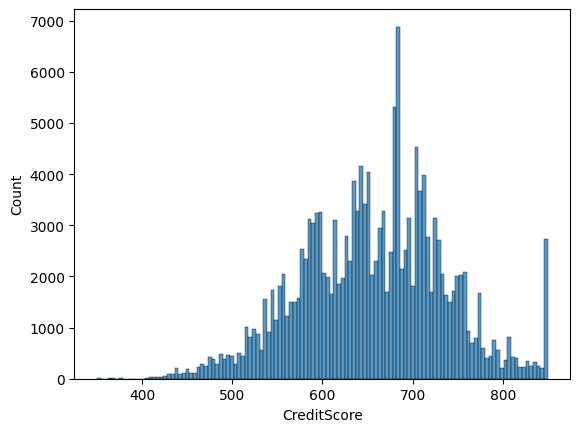

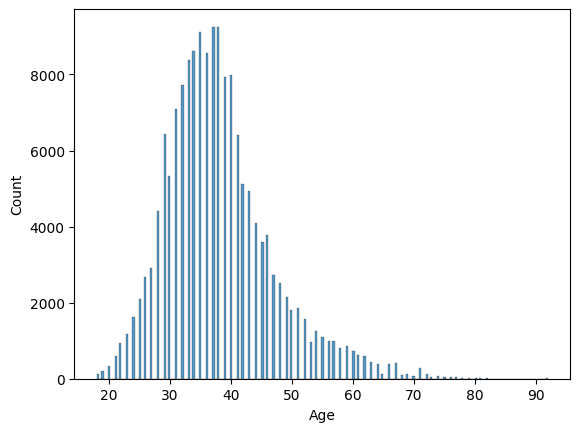

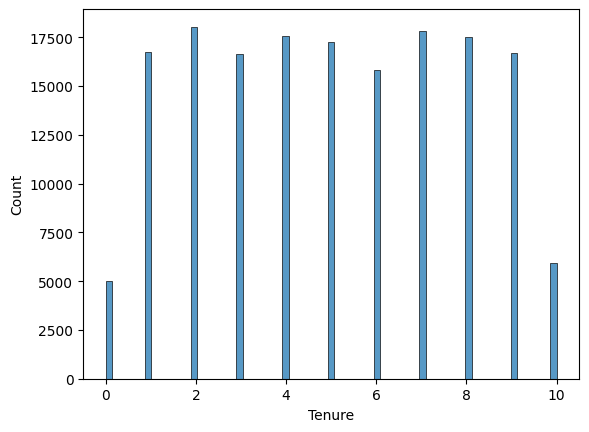

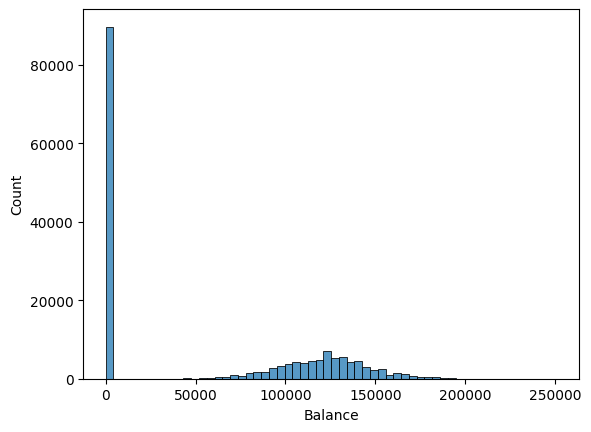

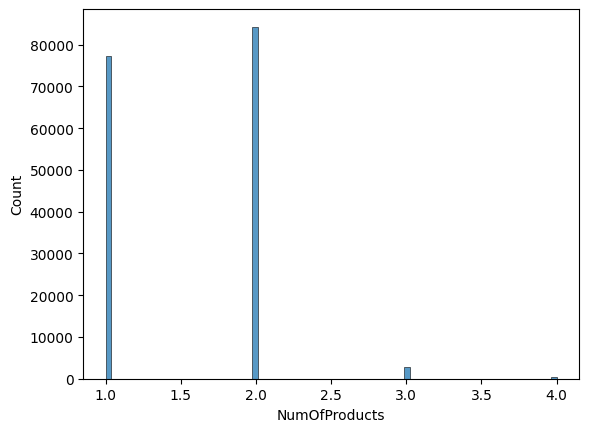

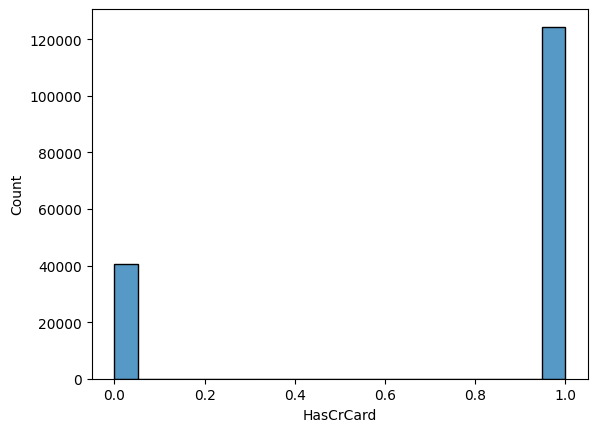

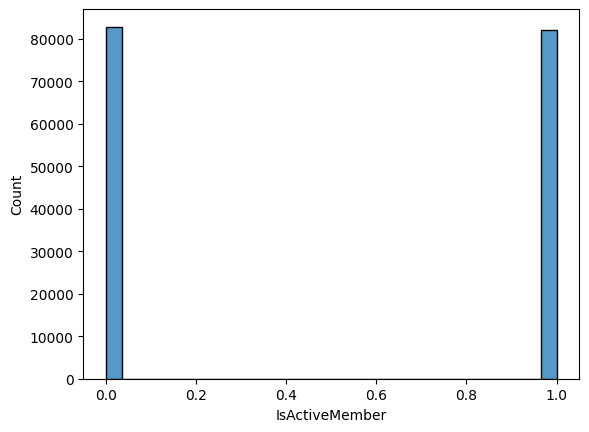

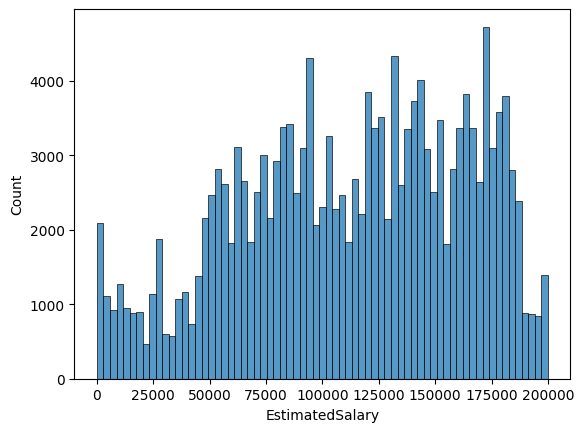

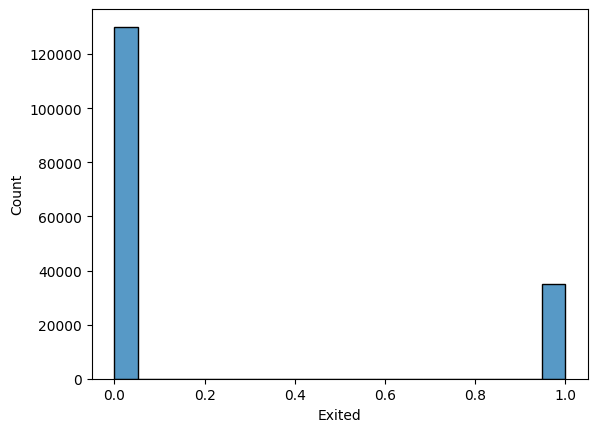

In [18]:

for col in continuous:
    sns.histplot(x = col, data = df)
    plt.show()

In [19]:
categorical = df.select_dtypes("object").columns.values
numerical = np.setdiff1d(df.columns, categorical)
continuous = df.select_dtypes(int).columns.values
discrete = np.setdiff1d( numerical,continuous)

Geography
France     94215
Spain      36213
Germany    34606
Name: count, dtype: int64



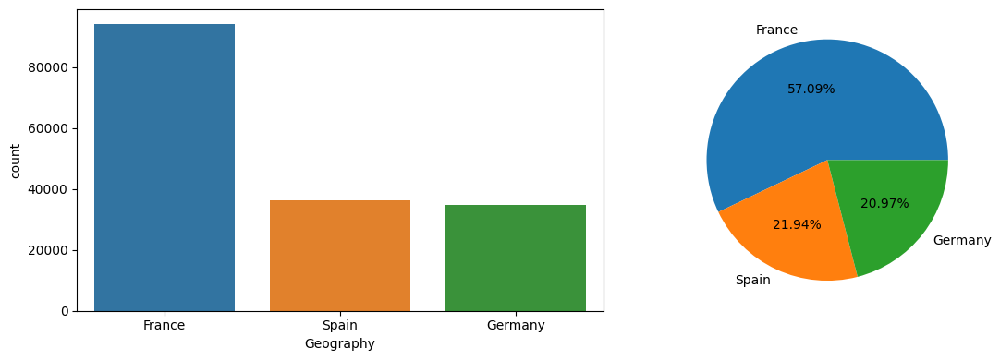

Gender
Male      93150
Female    71884
Name: count, dtype: int64



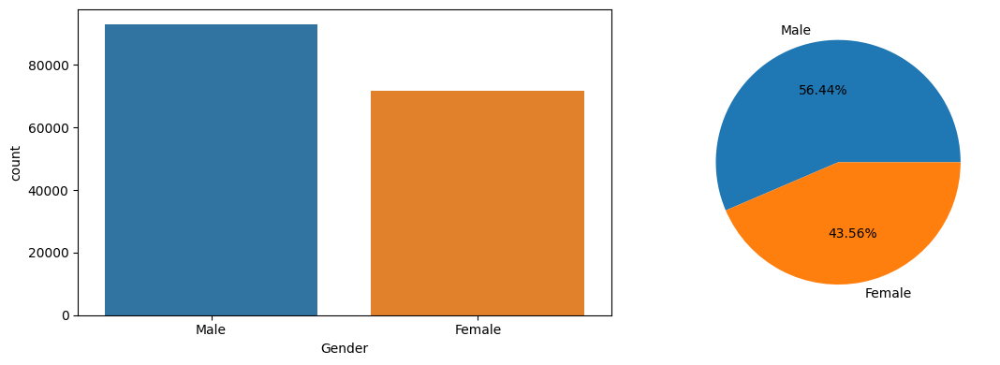

Age
37    9255
38    9246
35    9118
34    8625
36    8557
      ... 
78       9
82       7
84       4
83       3
85       3
Name: count, Length: 69, dtype: int64



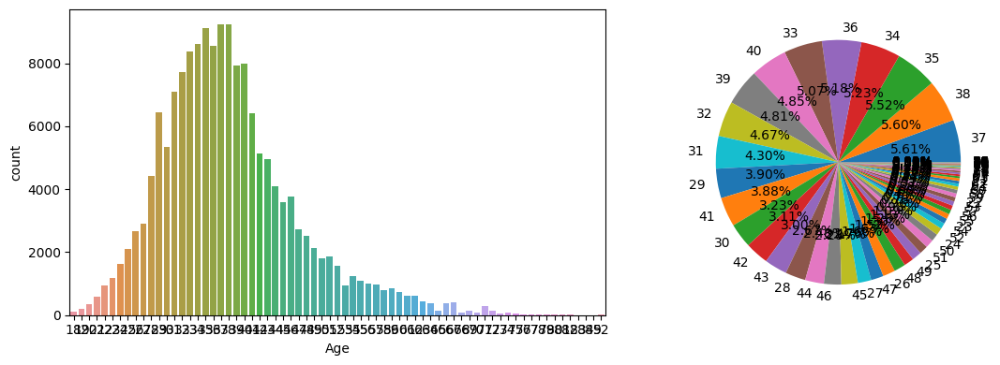

Balance
0.00         89648
124577.33       88
127864.40       64
122314.50       63
129855.32       59
             ...  
125824.21        1
158741.56        1
126815.52        1
61172.57         1
110993.29        1
Name: count, Length: 30075, dtype: int64



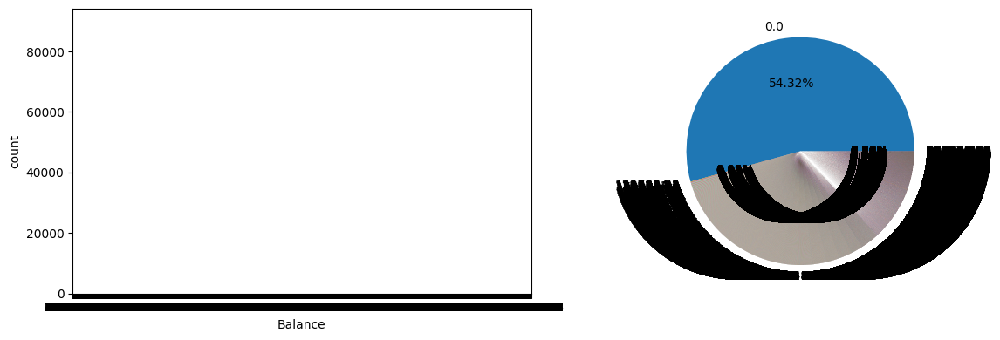

CreditScore
850    2532
678    2299
684    1718
667    1658
705    1605
       ... 
419       1
386       1
358       1
423       1
373       1
Name: count, Length: 457, dtype: int64



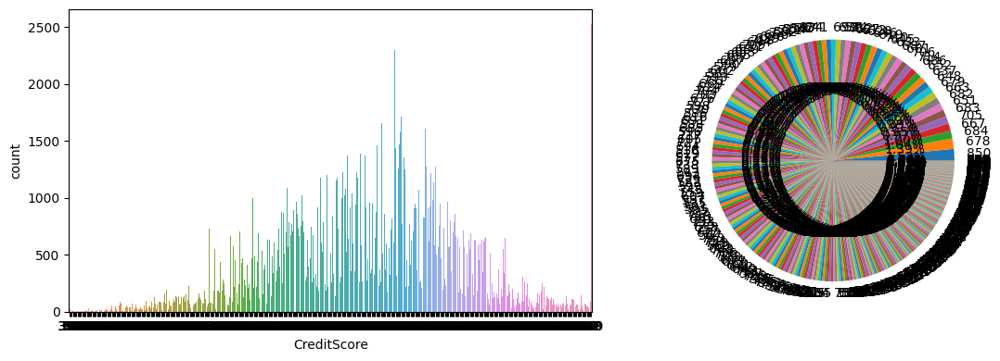

EstimatedSalary
88890.05     178
140941.47    107
167984.72    100
90876.95      98
129964.94     98
            ... 
102747.73      1
170593.45      1
109179.48      1
60538.47       1
71173.03       1
Name: count, Length: 55298, dtype: int64



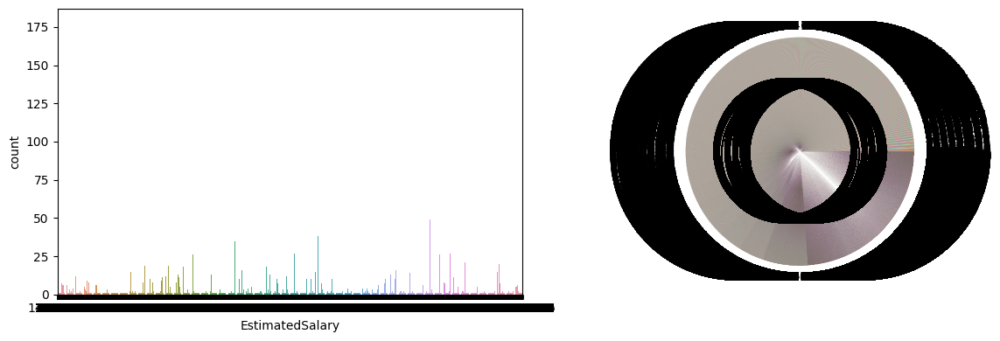

Exited
0    130113
1     34921
Name: count, dtype: int64



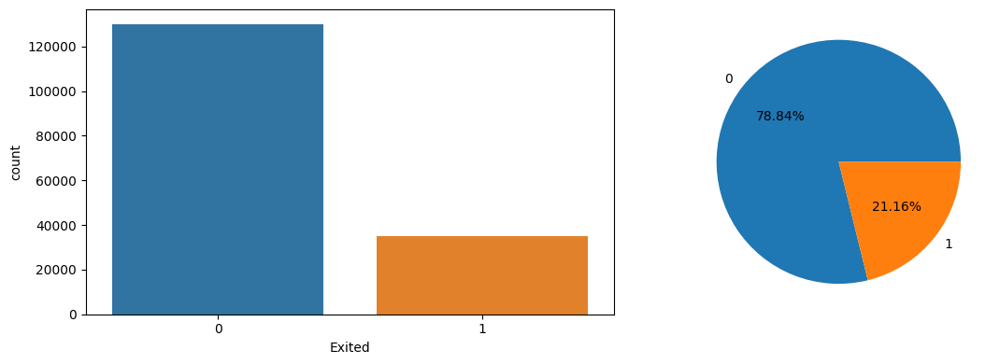

HasCrCard
1    124428
0     40606
Name: count, dtype: int64



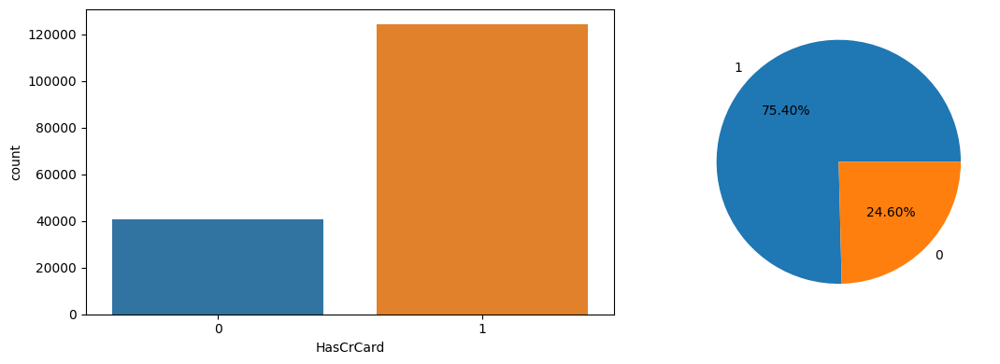

IsActiveMember
0    82885
1    82149
Name: count, dtype: int64



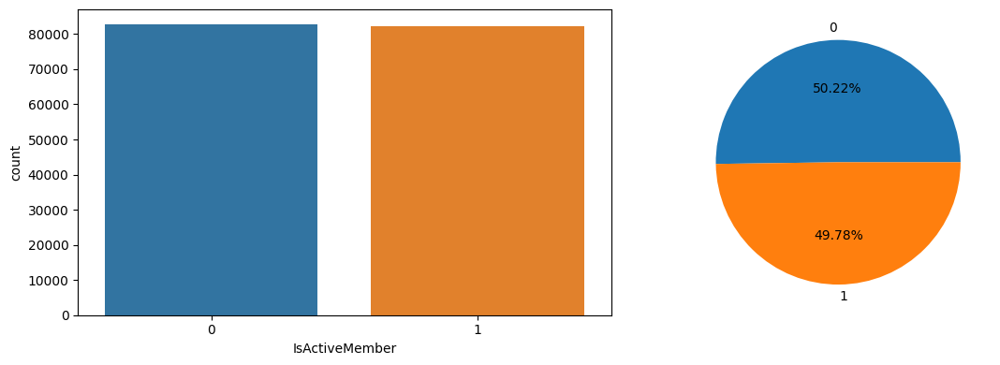

NumOfProducts
2    84291
1    77374
3     2894
4      475
Name: count, dtype: int64



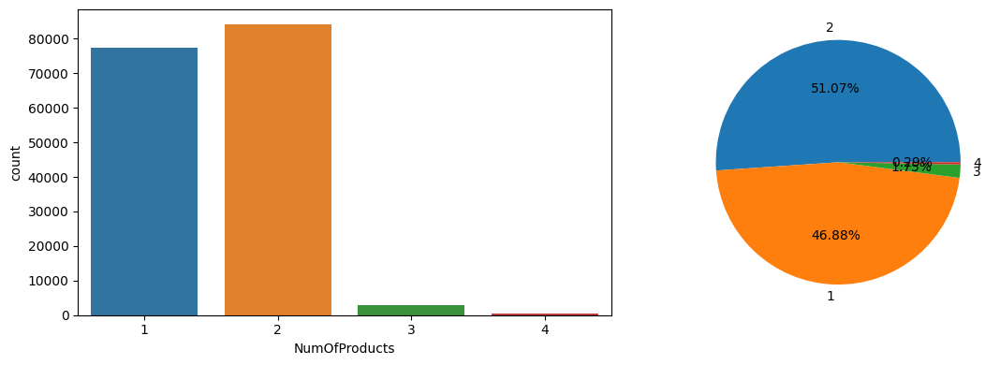

Tenure
2     18045
7     17810
4     17554
8     17520
5     17268
1     16760
9     16709
3     16630
6     15822
10     5909
0      5007
Name: count, dtype: int64



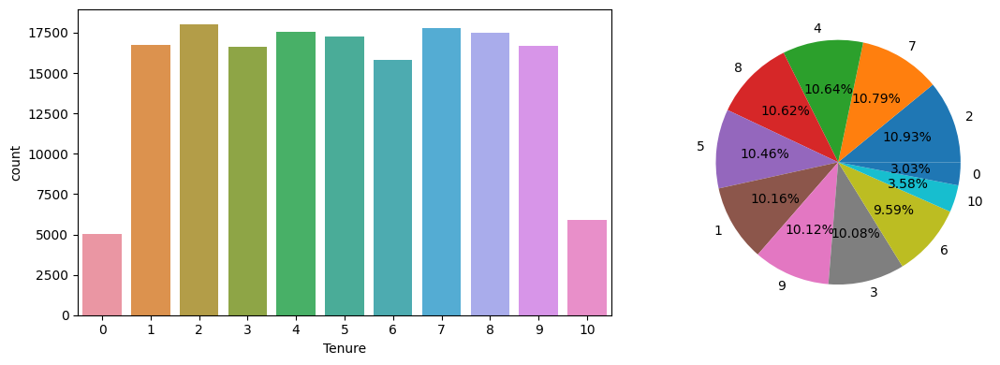

In [20]:
for col in np.concatenate([categorical, discrete]):
    col_val_counts = df[col].value_counts()
    print(col_val_counts, end = "\n\n")
    
    plt.figure(figsize = (12, 4))
    plt.subplot(1, 2, 1)
    sns.countplot(x = col, data = df)
    
    plt.subplot(1, 2, 2)
    plt.pie(col_val_counts, labels = col_val_counts.keys(), autopct = "%.2f%%")
    plt.tight_layout()
    plt.show()

In [21]:
import plotly.express as px
fig = px.scatter(df, x='Age', y='Balance')
fig.show()

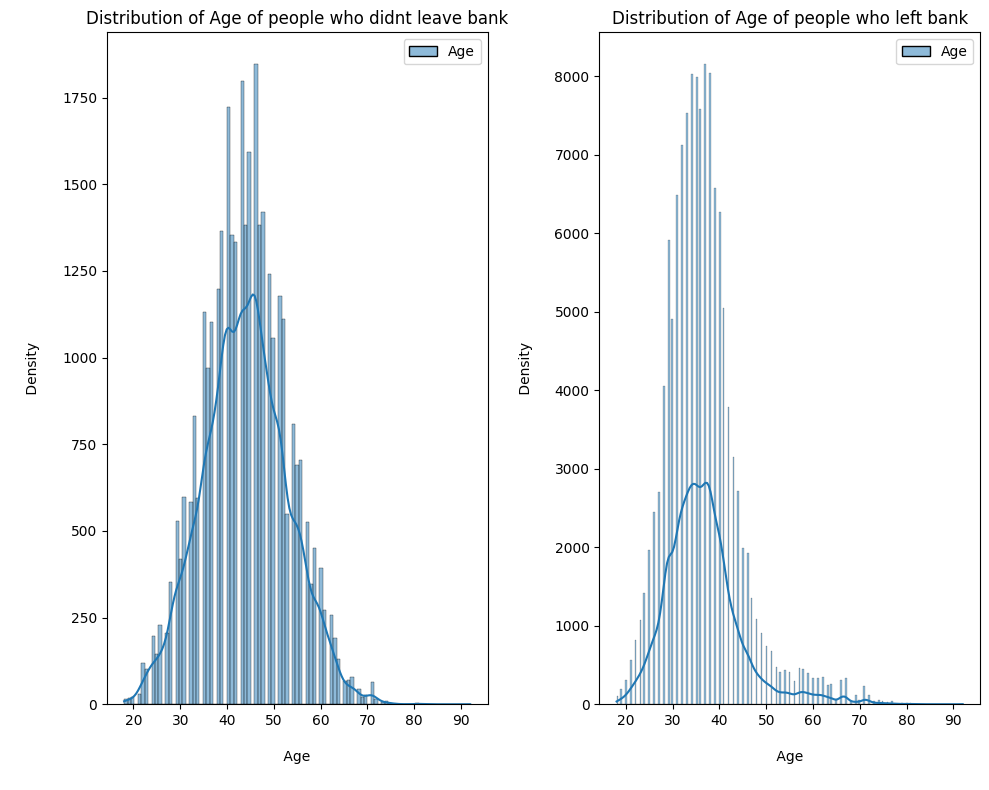

In [22]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 8))
sns.histplot(df.loc[df.Exited == 1][["Age"]],kde=True,color="grey", ax=axes[0])
axes[0].set_title('Distribution of Age of people who didnt leave bank')
axes[0].set_xlabel('\n Age \n')
axes[0].set_ylabel('\n Density \n')

sns.histplot(df.loc[df.Exited == 0][["Age"]],kde=True,color="grey", ax=axes[1])
axes[1].set_title('Distribution of Age of people who left bank')
axes[1].set_xlabel('\n Age \n')
axes[1].set_ylabel('\n Density \n')
plt.tight_layout()
plt.show()

In [23]:
df.groupby("Tenure").agg({"Balance": "mean"})

,Balance
Tenure,
0,61772.331067
1,57901.156943
2,53651.684208
3,56470.567355
4,54324.882710
5,55805.037831
6,55327.924977
7,53036.842830
8,54895.059781


In [24]:
fig = px.scatter(df, x='Balance', y='Tenure')
fig.show()

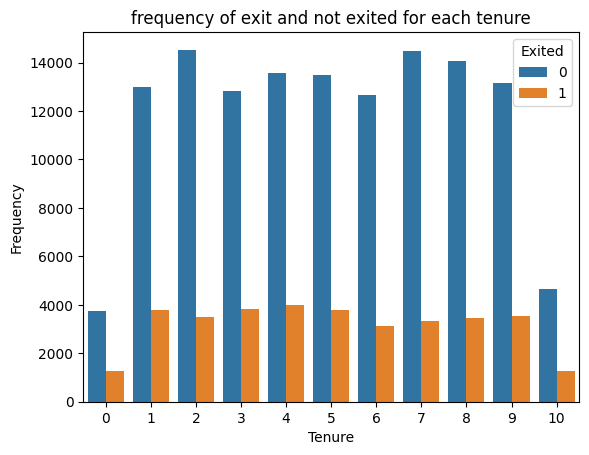

In [25]:
count=df.groupby(['Tenure','Exited']).size().reset_index(name='Frequency')
sns.barplot(x='Tenure',y='Frequency',hue='Exited',data=count)
plt.title('frequency of exit and not exited for each tenure')
plt.show()


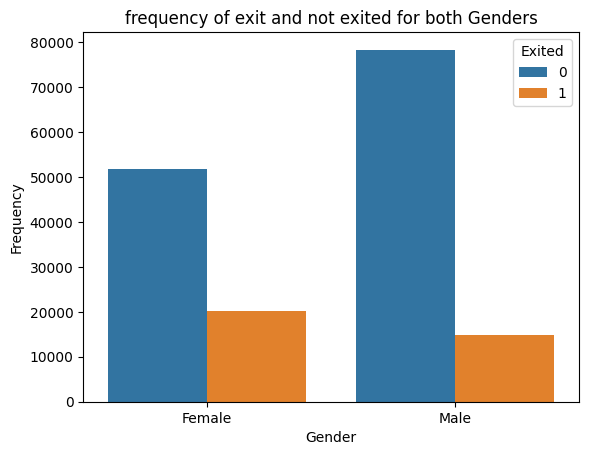

In [26]:
count=df.groupby(['Gender','Exited']).size().reset_index(name='Frequency')
sns.barplot(x='Gender',y='Frequency',hue='Exited',data=count)
plt.title('frequency of exit and not exited for both Genders')
plt.show()

In [27]:

counts = df.groupby(['Geography', 'Exited']).size().reset_index(name='Frequency')
sns.barplot(x='Geography', y='Frequency', hue='Exited', data=counts,pallate=)
plt.xlabel('Geography')
plt.ylabel('Frequency')
plt.title('Frequency of 0 and 1 for Each Geography')
plt.show()

SyntaxError: invalid syntax (2751210414.py, line 2)

In [ ]:
sns.barplot(x=df.NumOfProducts, y=df.Balance, errorbar='sd')  # ci='sd' shows error bars representing standard deviation
plt.xlabel('Number Of Products')
plt.ylabel('Average Balance')
plt.title('Number Of Products vs Average Balance')
plt.show()

In [ ]:
df.groupby("Exited").agg({"EstimatedSalary": "mean"})

In [ ]:
fig = px.box(df, x='CreditScore')
fig.show()

In [ ]:
# there are outliers in CreditScore, here is how to detect them
q1 = df['CreditScore'].quantile(.25)
q3 = df['CreditScore'].quantile(.75)
iqr = q3-q1

lower = q1-(iqr*1.5)
upper = q3+(iqr*1.5)
lower, upper

In [ ]:
print('Number of outliers in CreditScore column:',len(df.loc[(df['CreditScore']>upper)|(df['CreditScore']<lower)]))